# Ames Real Estate Machine Learning Project


### Yi Cao, Daniel Choy, Ling Ge Zeng

### Objective: The first part of this project explores the characteristics of Ames housing market. In addition, we would like to see if any of these characteristics will be useful to house flippers or home builders with regard to making profit. The second part of this project includes a comparison of different linear and non-linear machine learning models and assess their ability to capture Ames housing market characteristics and how reliable each of these models may be in prediciting future housing prices. 

In [19]:
# Import Libraries
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import seaborn as sns
import pandas as pd
import matplotlib as mpl
# import chart_studio.plotly as py
import numpy as np
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
# from geopy import Nominatim
# from geopy.extra.rate_limiter import RateLimiter
%matplotlib inline

In [20]:
# Run the file Data_Preprocessing.ipynb which cleaned the data. Pre-processed data are saved in the data file

housing = pd.read_csv('data/Ames_Housing_Price_Data.csv', index_col = 0)
real_estate = pd.read_csv('data/Ames_Real_Estate_Data.csv', index_col = 0)
# combined data set:
ames_df = pd.read_csv('data/final_df.csv', index_col = 0)

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (36,40,81,87) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# Overview of Ames Housing Market

In [25]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df

,Neighborhood,geometry
0,City Center,"POLYGON ((-93.62326 42.06548, -93.62051 42.055..."
1,24th St / Grand Ave,"POLYGON ((-93.62068 42.04579, -93.64017 42.045..."
2,E 13th St / Duff Ave,"POLYGON ((-93.63476 42.03450, -93.63373 42.033..."
3,S Duff Ave / E Lincoln Way,"POLYGON ((-93.57141 42.02896, -93.61656 42.023..."
4,Grand Ave / 30th St,"POLYGON ((-93.64240 42.05643, -93.63450 42.045..."
5,Stange Rd / Pammel Ct,"POLYGON ((-93.64480 42.04540, -93.64480 42.035..."
6,Iowa State University,"POLYGON ((-93.65570 42.03450, -93.65630 42.034..."
7,Woodland St / West St,"POLYGON ((-93.65656 42.02819, -93.66840 42.028..."
8,Ontario,"POLYGON ((-93.69887 42.03457, -93.69905 42.022..."
9,Lincoln Way / 500th Ave,"POLYGON ((-93.69887 42.02245, -93.69879 42.014..."


In [26]:
neighborhood_new = []
for row in ames_df['Neighborhood']:
   if row == 'Blmngtn': neighborhood_new.append('Gilbert')
   if row == 'Blueste': neighborhood_new.append('Lincoln Way / State Ave')
   if row == 'BrDale': neighborhood_new.append('Grand Ave / 30th St')
   if row == 'BrkSide': neighborhood_new.append('E 13th St / Duff Ave')
   if row == 'ClearCr': neighborhood_new.append('Ontario')
   if row == 'CollgCr': neighborhood_new.append('Lincoln Way / 500th Ave')
   if row == 'Crawfor': neighborhood_new.append('S Duff Ave / E Lincoln Way')
   if row == 'Edwards': neighborhood_new.append('Woodland St / West St')
   if row == 'Gilbert': neighborhood_new.append('Gilbert')
   if row == 'IDOTRR' : neighborhood_new.append('S Duff Ave / E Lincoln Way')
   if row == 'MeadowV': neighborhood_new.append('S Duff Ave / Airport Rd')
   if row == 'Mitchel': neighborhood_new.append('S Duff Ave / Airport Rd')
   if row == 'NAmes': neighborhood_new.append('City Center')
   if row == 'NoRidge': neighborhood_new.append('Gilbert')
   if row == 'NPkVill': neighborhood_new.append('Grand Ave / 30th St')
   if row == 'NridgHt': neighborhood_new.append('Gilbert')
   if row == 'NWAmes': neighborhood_new.append('24th St / Grand Ave')
   if row == 'OldTown': neighborhood_new.append('E 13th St / Duff Ave')
   if row == 'SWISU': neighborhood_new.append('Lincoln Way / State Ave')
   if row == 'Sawyer': neighborhood_new.append('Ontario')
   if row == 'SawyerW': neighborhood_new.append('Ontario')
   if row == 'Somerst' : neighborhood_new.append('Grand Ave / 30th St')
   if row == 'StoneBr': neighborhood_new.append('Grand Ave / 30th St')
   if row == 'Timber': neighborhood_new.append('S Duff Ave / Airport Rd')
   if row == 'Veenker': neighborhood_new.append('Stange Rd / Pammel Ct')
   if row == 'Greens': neighborhood_new.append('Stange Rd / Pammel Ct')
ames_df['Neighborhood_New'] = neighborhood_new

In [27]:
ames_df2 = ames_df.copy()

In [ ]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))


plt.figure(figsize = (17,10))

plt.subplot(2,2,1).set_title("Basement Quality and Price")
sns.boxplot(x = 'BsmtQual', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = housing)

plt.subplot(2,2,2).set_title("Basement Condition and Price")
sns.boxplot(x = 'BsmtCond', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = housing)


## Ames House Sale Price Distribution

Text(0, 0.5, 'Density')

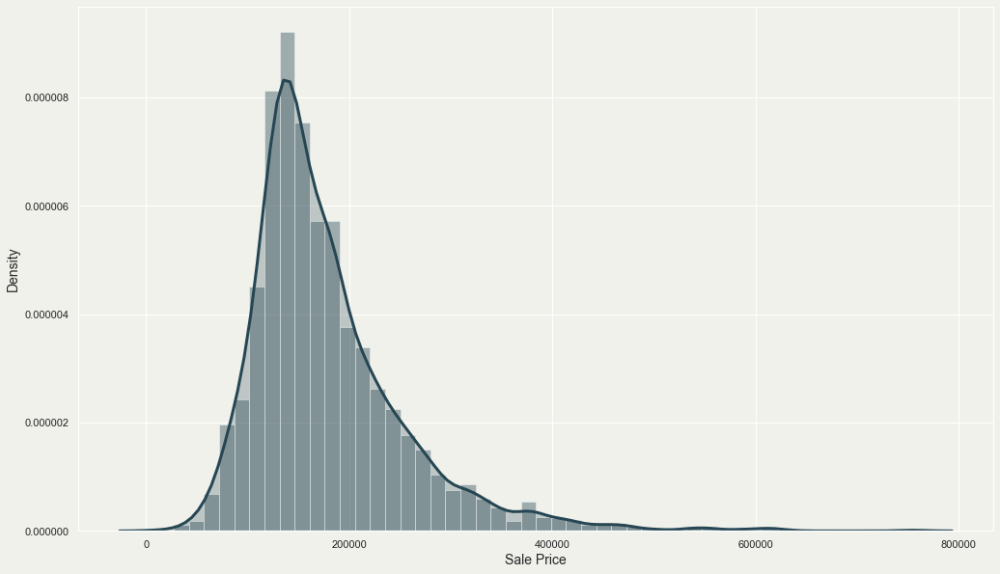

In [154]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
plt.figure(figsize = (17,10))
sns.distplot(ames_df['SalePrice'], kde = True, kde_kws = {'shade': True, 'linewidth': 3})
plt.xlabel('Sale Price', fontdict = {'fontsize' : 14})
plt.ylabel('Density', fontdict = {'fontsize' : 14})





#### The distribution graph indicates that Ames housing market has more outliers on the expensive side

## Ames Housing Market Trend

In [187]:
ames_df2['PrPerAbvGrSF'] = ames_df2['SalePrice']/ames_df2['GrLivArea']
ames_df2['PrPerAbvGrSF'].dtypes
pd.to_datetime(ames_df2['YrSold'], format = '%Y')
ames_df2[['YrSold']]

,YrSold
0,2010
1,2009
2,2009
3,2007
4,2009
...,...
2598,2009
2599,2009
2600,2007
2601,2007


In [205]:
ames_df2['YrSold'].dtypes
ames_df2['YrSold'] = pd.to_datetime(ames_df2['YrSold'], format = '%Y')
ames_df2['YrSold'].dtypes
ames_df2['year'] = pd.DatetimeIndex(ames_df2['YrSold']).year
ames_df2['year'].dtypes
ames_df2['year'] = ames_df2.year.astype(str)
MedPrPerAbvGrSF = ames_df2.groupby('year')[['PrPerAbvGrSF']].mean().reset_index()

Text(0, 0.5, 'Sale Price per Square Feet')

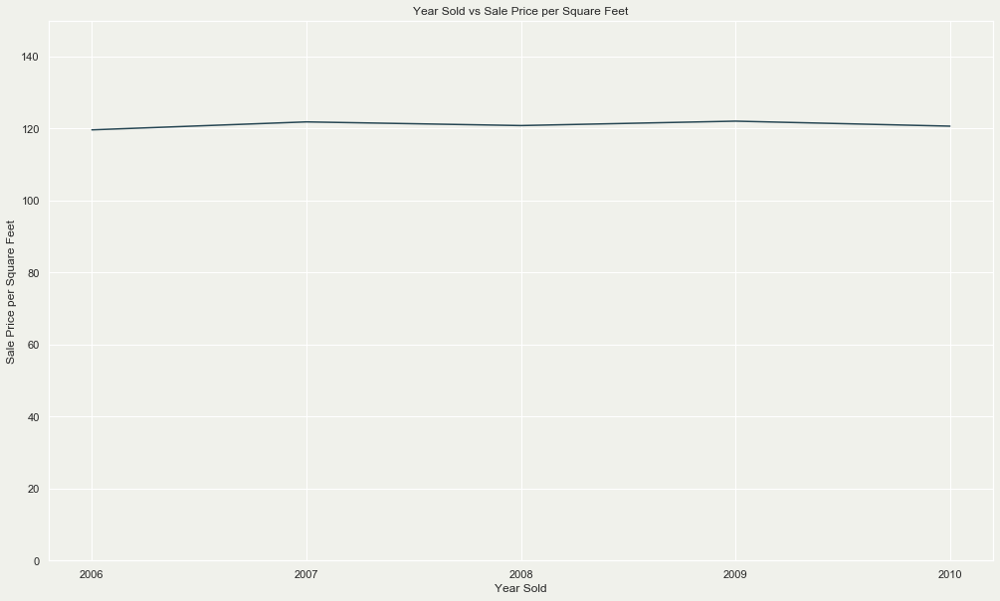

In [206]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))

fig, ax1 = plt.subplots(figsize=(17,10))
sns.lineplot(MedPrPerAbvGrSF['year'], MedPrPerAbvGrSF['PrPerAbvGrSF'])
plt.ylim(0, 150)
ax1.set_title('Year Sold vs Sale Price per Square Feet', fontsize=12)
ax1.set_xlabel('Year Sold', fontsize=12)
ax1.set_ylabel('Sale Price per Square Feet', fontsize=12)


#### Ames housing market is relatively stable in terms of per square foot pricing over the years

## Ames Housing Market Overview by Price

In [157]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df
ames_df2 = ames_df.copy()
Q1 = np.percentile(ames_df2['SalePrice'], 25, interpolation = 'midpoint')
Q2 = np.percentile(ames_df2['SalePrice'], 50, interpolation = 'midpoint')
Q3 = np.percentile(ames_df2['SalePrice'], 75, interpolation = 'midpoint')
IQR = Q3 - Q1

SalePrice_new = []
for row in ames_df2['SalePrice']:
    if row < 129950.0 : SalePrice_new.append('$')
    elif row < 159500.0 : SalePrice_new.append('$$')
    elif row < 208950.0 : SalePrice_new.append('$$$')
    elif row < 327450.0 : SalePrice_new.append('$$$$')
    else : SalePrice_new.append('$$$$$')
ames_df2['price_type'] = SalePrice_new

from shapely.geometry import Point, shape

locs_geometry = [Point(xy) for xy in zip(ames_df2.longitude2,
                                         ames_df2.latitude2)]

crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(ames_df2, crs=crs, geometry=locs_geometry)

import folium
locs_map = folium.Map(location=[42.045042, -93.6473567],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='$')
feature_2 = folium.FeatureGroup(name='$$')
feature_3 = folium.FeatureGroup(name='$$$')
feature_4 = folium.FeatureGroup(name='$$$$')
feature_5 = folium.FeatureGroup(name='$$$$$')

for i, v in locs_gdf.iterrows():
    popup = """
    Location id : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['PID'], v['price_type'], v['Neighborhood'], v['SalePrice'])
    
    if v['price_type'] == '$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#264653',
                            fill_color='#264653',
                            fill=True).add_to(feature_1)
    elif v['price_type'] == '$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#2a9d8f',
                            fill_color='#2a9d8f',
                            fill=True).add_to(feature_2)
    elif v['price_type'] == '$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e9c46a',
                            fill_color='#e9c46a',
                            fill=True).add_to(feature_3)
    elif v['price_type'] == '$$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#f4a261',
                            fill_color='#f4a261',
                            fill=True).add_to(feature_4)
    elif v['price_type'] == '$$$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e76f51',
                            fill_color='#e76f51',
                            fill=True).add_to(feature_5)

feature_1.add_to(locs_map)
feature_2.add_to(locs_map)
feature_3.add_to(locs_map)
feature_4.add_to(locs_map)
feature_5.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)
locs_map

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


#### Note: 

## Building Type in Ames

In [159]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df
ames_df2 = ames_df.copy()

SalePrice_new = []
for row in ames_df2['BldgType']:
    if row == '1Fam' : SalePrice_new.append('1 Family Detached')
    elif row == 'TwnhsE' : SalePrice_new.append('Townhouse End Unit')
    elif row == 'Twnhs': SalePrice_new.append('Townhouse Inner Unit')
    elif row == 'Duplex' : SalePrice_new.append('Duplex')
    else : SalePrice_new.append('2-Family Conversion')
ames_df2['building_type'] = SalePrice_new

from shapely.geometry import Point, shape

locs_geometry = [Point(xy) for xy in zip(ames_df2.longitude2,
                                         ames_df2.latitude2)]

crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(ames_df2, crs=crs, geometry=locs_geometry)

import folium
locs_map = folium.Map(location=[42.045042, -93.6473567],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='1 Family Detached')
feature_2 = folium.FeatureGroup(name='Townhouse End Unit')
feature_3 = folium.FeatureGroup(name='Townhouse Inner Unit')
feature_4 = folium.FeatureGroup(name='Duplex')
feature_5 = folium.FeatureGroup(name='2-Family Conversion')

for i, v in locs_gdf.iterrows():
    popup = """
    Location id : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['PID'], v['building_type'], v['Neighborhood'], v['SalePrice'])
    
    if v['building_type'] == '1 Family Detached':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#264653',
                            fill_color='#264653',
                            fill=True).add_to(feature_1)
    elif v['building_type'] == 'Townhouse End Unit':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#2a9d8f',
                            fill_color='#2a9d8f',
                            fill=True).add_to(feature_2)
    elif v['building_type'] == 'Townhouse Inner Unit':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e9c46a',
                            fill_color='#e9c46a',
                            fill=True).add_to(feature_3)
    elif v['building_type'] == 'Duplex':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#f4a261',
                            fill_color='#f4a261',
                            fill=True).add_to(feature_4)
    elif v['building_type'] == '2-Family Conversion':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e76f51',
                            fill_color='#e76f51',
                            fill=True).add_to(feature_5)

feature_1.add_to(locs_map)
feature_2.add_to(locs_map)
feature_3.add_to(locs_map)
feature_4.add_to(locs_map)
feature_5.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)
locs_map

## MSZoning

<Figure size 1224x720 with 0 Axes>

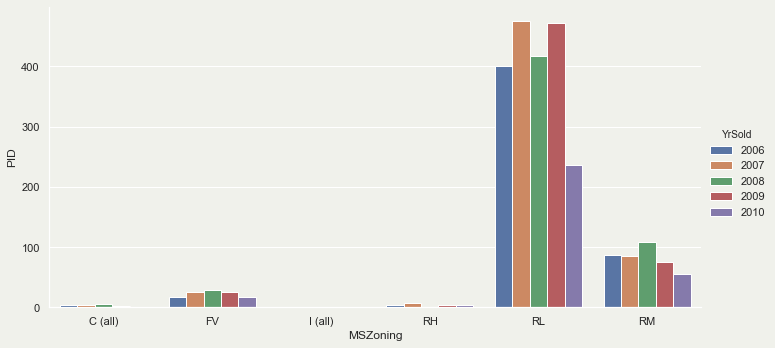

In [264]:
Cnt_MSZ = ames_df.groupby(['MSZoning','YrSold']).count()[['PID']].reset_index()
plt.figure(figsize = (17,10))
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.catplot(x='MSZoning', y = 'PID', hue = 'YrSold', kind = 'bar', data = Cnt_MSZ, height = 5, aspect = 2)

# Break it down into different categories

#### 1. Neighborhood

#### 2. House Size

#### 3. House Age

#### 4. House Features: Basement, Kitchen, and Garage

#### 5. Other Features

## Neighborhood

In [28]:
ames_df3 = ames_df2.groupby(['Neighborhood_New'])['SalePrice', 'total_LivArea'].mean().reset_index()
ames_df3
ames_geo_mean_df = pd.merge(nbh_geo_df, ames_df3, left_on = 'Neighborhood', right_on='Neighborhood_New')
ames_geo_mean_df
ames_geo_mean_df['price_per_sf'] = ames_geo_mean_df['SalePrice'] / ames_geo_mean_df['total_LivArea']
ames_geo_mean_df

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,Neighborhood,geometry,Neighborhood_New,SalePrice,total_LivArea,price_per_sf
0,City Center,"POLYGON ((-93.62326 42.06548, -93.62051 42.055...",City Center,144926.207229,1499.122892,96.674001
1,24th St / Grand Ave,"POLYGON ((-93.62068 42.04579, -93.64017 42.045...",24th St / Grand Ave,190018.588710,2175.274194,87.353856
2,E 13th St / Duff Ave,"POLYGON ((-93.63476 42.03450, -93.63373 42.033...",E 13th St / Duff Ave,126360.398734,1420.186709,88.974497
3,S Duff Ave / E Lincoln Way,"POLYGON ((-93.57141 42.02896, -93.61656 42.023...",S Duff Ave / E Lincoln Way,160126.730994,1666.169591,96.104701
4,Grand Ave / 30th St,"POLYGON ((-93.64240 42.05643, -93.63450 42.045...",Grand Ave / 30th St,219764.551440,1990.600823,110.401116
5,Stange Rd / Pammel Ct,"POLYGON ((-93.64480 42.04540, -93.64480 42.035...",Stange Rd / Pammel Ct,236364.516129,2563.161290,92.216013
6,Woodland St / West St,"POLYGON ((-93.65656 42.02819, -93.66840 42.028...",Woodland St / West St,131885.455090,1520.916168,86.714480
7,Ontario,"POLYGON ((-93.69887 42.03457, -93.69905 42.022...",Ontario,167637.658703,1811.614334,92.534959
8,Lincoln Way / 500th Ave,"POLYGON ((-93.69887 42.02245, -93.69879 42.014...",Lincoln Way / 500th Ave,198067.408333,1969.645833,100.559910
9,Lincoln Way / State Ave,"POLYGON ((-93.65905 42.02252, -93.65888 42.007...",Lincoln Way / State Ave,135032.352941,1631.019608,82.790147


## Ames House Average Sale Price by Neighborhood

In [22]:
from branca.colormap import linear
nbh_count_colormap = linear.YlGnBu_09.scale(min(ames_df3['SalePrice']),
                                            max(ames_df3['SalePrice']))

nbh_locs_map = folium.Map(location=[42.045042, -93.6473567],
                          zoom_start = 11.5, tiles='cartodbpositron')

style_function = lambda x: {
    'fillColor': nbh_count_colormap(x['properties']['SalePrice']),
    'color': 'black',
    'weight': 2,
    'fillOpacity': 0.7
}

folium.GeoJson(
    ames_geo_mean_df,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Neighborhood_New', 'SalePrice'],
        aliases=['Neighborhood_New', 'Sales Price Mean Value'],
        localize=True
    )
).add_to(nbh_locs_map)

nbh_count_colormap.add_to(nbh_locs_map)
nbh_count_colormap.caption = 'Ames Housing Sale Price by Neighborhood'
nbh_count_colormap.add_to(nbh_locs_map)
folium.map.CustomPane('labels').add_to(nbh_locs_map)
folium.TileLayer('CartoDBPositronOnlyLabels',
                 pane='labels').add_to(nbh_locs_map)
nbh_locs_map

#### Most expensive houses are concentrated in northern part of Ames 

## Distance vs Sale Price from Iowa State University

Text(0, 0.5, 'Sale Price per Square Feet')

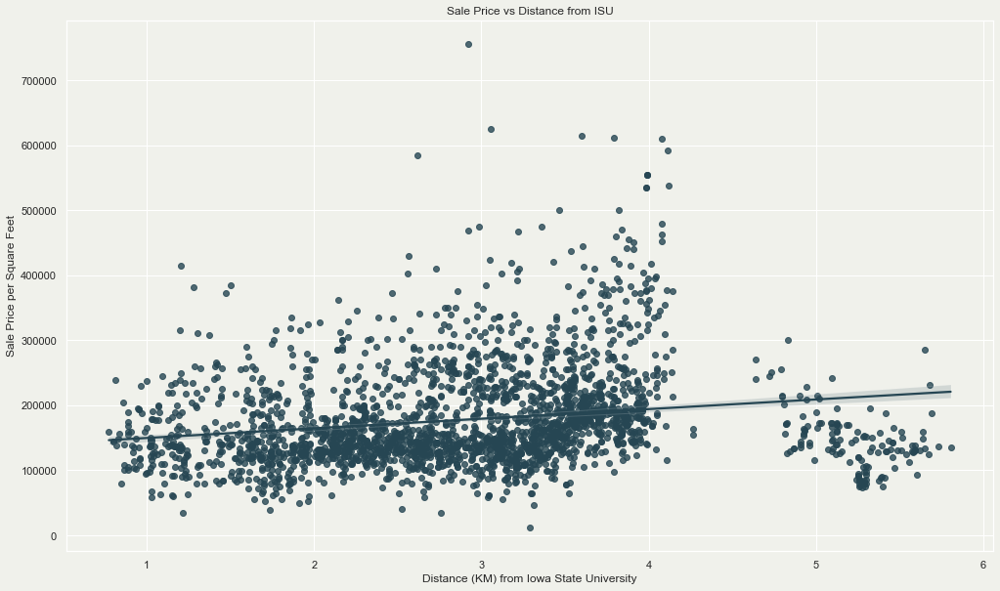

In [213]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})

colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
fig, ax1 = plt.subplots(figsize=(17,10))
sns.regplot(x = 'Distance', y = 'SalePrice', data = ames_df2)
ax1.set_title('Sale Price vs Distance from ISU', fontsize=12)
ax1.set_xlabel('Distance (KM) from Iowa State University', fontsize=12)
ax1.set_ylabel('Sale Price per Square Feet', fontsize=12)

## Sale Price vs Distance from Iowa State University


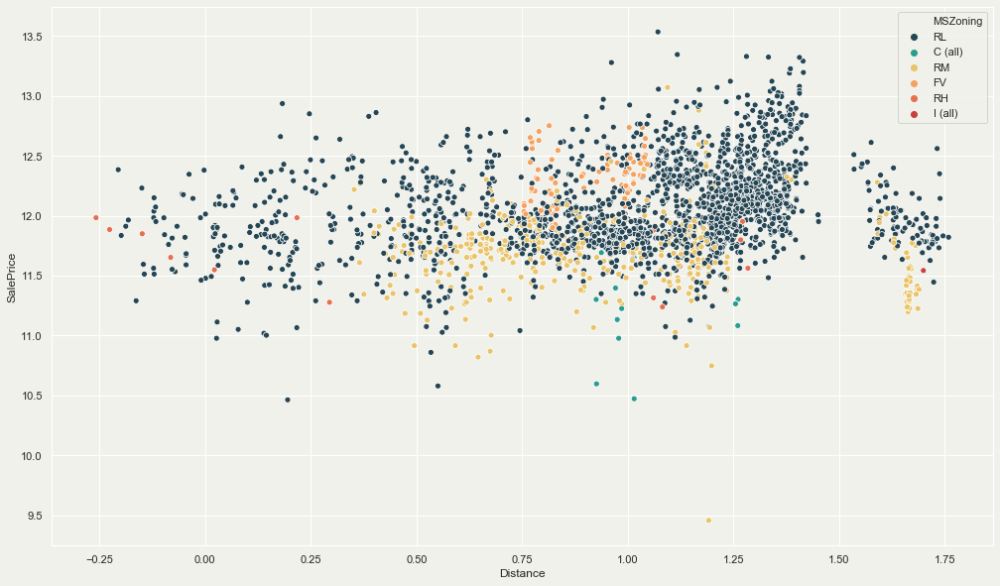

In [214]:
# Distance VS Sale Price
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
plt.figure(figsize = (17,10))
log_distance = np.log(ames_df['Distance'])
log_SalePrice= np.log(ames_df['SalePrice'])
sns.scatterplot(x = log_distance, y = log_SalePrice, hue = 'MSZoning', data = ames_df2)

#### Note:

# House Size

## Sale Price vs Total Living Area

Text(0, 0.5, 'Log of Sale Price')

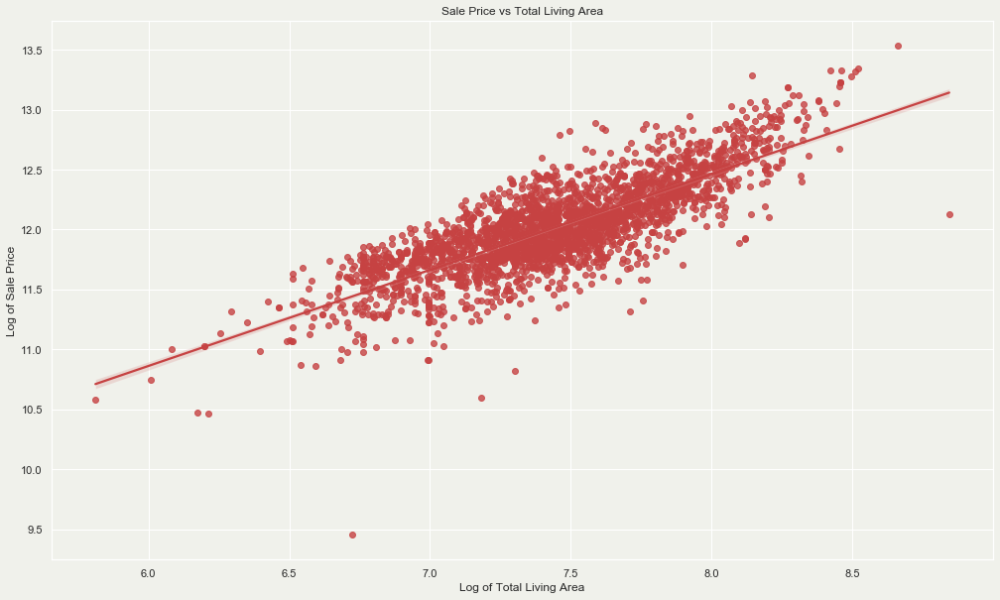

In [37]:
fig, ax1 = plt.subplots(figsize=(17,10))
X = np.log(ames_df['total_LivArea']) 
Y = np.log(ames_df['SalePrice'])
sns.regplot(X, Y, color = '#c64242')
ax1.set_title('Sale Price vs Total Living Area', fontsize=12)
ax1.set_xlabel('Log of Total Living Area', fontsize=12)
ax1.set_ylabel('Log of Sale Price', fontsize=12)

#### Larger living area leads to higher sale price; in addition, the impact of living area on sale price wanes off as the living area continues to increase.

## Sale Price per Square Feet by Neighborhood

In [23]:
from branca.colormap import linear
nbh_count_colormap2 = linear.YlGnBu_09.scale(min(ames_geo_mean_df['price_per_sf']),
                                            max(ames_geo_mean_df['price_per_sf']))

nbh_locs_map2 = folium.Map(location=[42.045042, -93.6473567],
                          zoom_start = 11.5, tiles='cartodbpositron')

style_function = lambda x: {
    'fillColor': nbh_count_colormap2(x['properties']['price_per_sf']),
    'color': 'black',
    'weight': 2,
    'fillOpacity': 0.7
}

folium.GeoJson(
    ames_geo_mean_df,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Neighborhood_New', 'price_per_sf'],
        aliases=['Neighborhood', 'Sales Price per Square Feet'],
        localize=True
    )
).add_to(nbh_locs_map2)

nbh_count_colormap2.add_to(nbh_locs_map2)
nbh_count_colormap2.caption = 'Ames Housing Sale Price per Square Feet by Neighborhood'
nbh_count_colormap2.add_to(nbh_locs_map2)
folium.map.CustomPane('labels').add_to(nbh_locs_map2)
folium.TileLayer('CartoDBPositronOnlyLabels',
                 pane='labels').add_to(nbh_locs_map2)
nbh_locs_map2

#### Note: 

# House Age

## Age Characteristics of Houses at Ames  

In [75]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df
ames_df2 = ames_df.copy()
Q1 = np.percentile(ames_df2['age_building'], 25, interpolation = 'midpoint')
Q2 = np.percentile(ames_df2['age_building'], 50, interpolation = 'midpoint')
Q3 = np.percentile(ames_df2['age_building'], 75, interpolation = 'midpoint')
IQR = Q3 - Q1

building_age_new = []
for row in ames_df2['age_building']:
    if row < 5 : building_age_new.append('New')
    elif row < 16 : building_age_new.append('Fairly New')
    elif row < 42 : building_age_new.append('Fairly Old')
    else : building_age_new.append('Old')
ames_df2['age_building_new'] = building_age_new

from shapely.geometry import Point, shape

locs_geometry = [Point(xy) for xy in zip(ames_df2.longitude2,
                                         ames_df2.latitude2)]

crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(ames_df2, crs=crs, geometry=locs_geometry)

import folium
locs_map = folium.Map(location=[42.045042, -93.6473567],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='New')
feature_2 = folium.FeatureGroup(name='Fairly New')
feature_3 = folium.FeatureGroup(name='Fairly Old')
feature_4 = folium.FeatureGroup(name='Old')


for i, v in locs_gdf.iterrows():
    popup = """
    Location id : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['PID'], v['age_building_new'], v['Neighborhood'], v['age_building'])
    
    if v['age_building_new'] == 'New':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#264653',
                            fill_color='#264653',
                            fill=True).add_to(feature_1)
    elif v['age_building_new'] == 'Fairly New':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#2a9d8f',
                            fill_color='#2a9d8f',
                            fill=True).add_to(feature_2)
    elif v['age_building_new'] == 'Fairly Old':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e9c46a',
                            fill_color='#e9c46a',
                            fill=True).add_to(feature_3)
    elif v['age_building_new'] == 'Old':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#f4a261',
                            fill_color='#f4a261',
                            fill=True).add_to(feature_4)

feature_1.add_to(locs_map)
feature_2.add_to(locs_map)
feature_3.add_to(locs_map)
feature_4.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)
locs_map

## Sale Price vs Year Built

Text(0, 0.5, 'Sale Price')

<Figure size 1224x720 with 0 Axes>

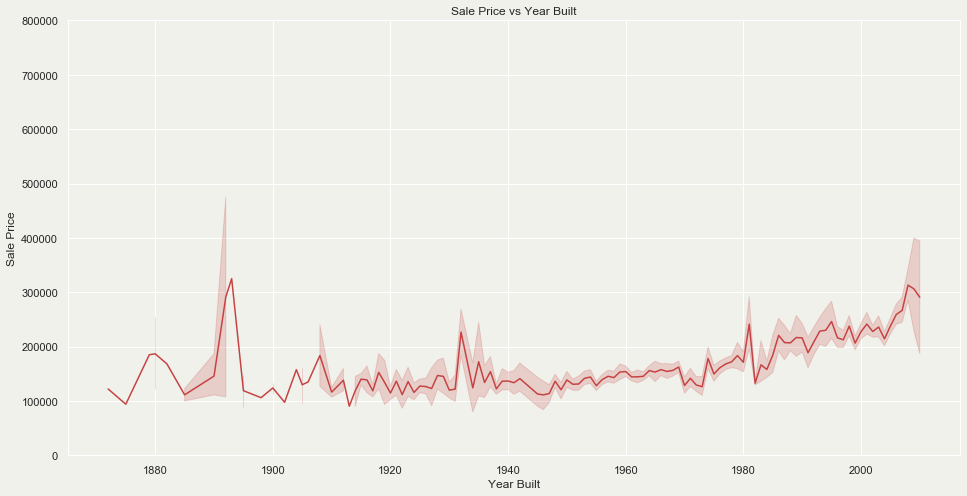

In [220]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
var = 'YearBuilt'
plt.figure(figsize = (17,10))
data = pd.concat([housing['SalePrice'], housing[var]], axis=1)
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.lineplot(x=var, y="SalePrice", data=data, color = '#c64242')
fig.axis(ymin=0, ymax=800000);
ax.set_title('Sale Price vs Year Built', fontsize=12)
ax.set_xlabel('Year Built', fontsize=12)
ax.set_ylabel('Sale Price', fontsize=12)

#### Recently built houses are relatively more expensive

In [89]:
from ames_function import feature_eng
house_df_eng = feature_eng(ames_df)
ames_df['effective_age'] = ames_df['YrSold'] - ames_df['YearRemodAdd']
ames_df['actual_age'] = ames_df['YrSold'] - ames_df['YearBuilt']

## Sale Price vs Effective House Age 

(1, 62)

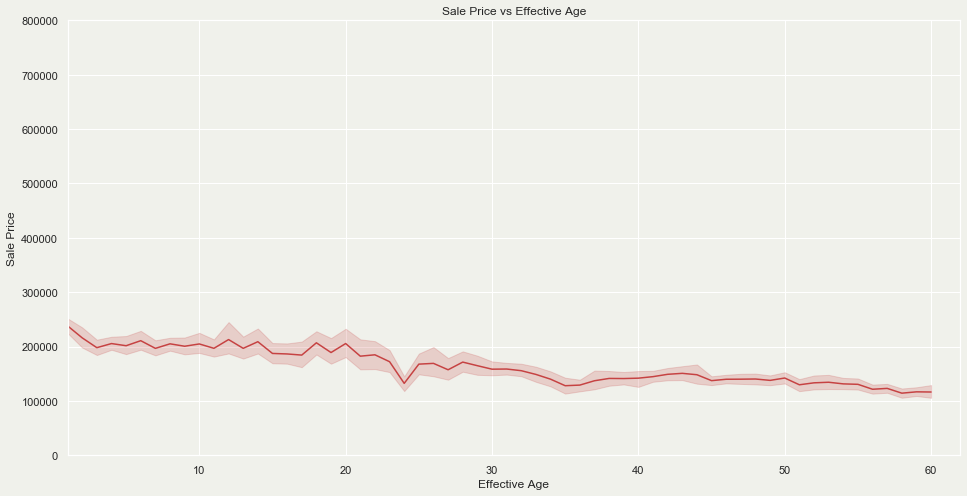

In [221]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
var = 'effective_age'
data = pd.concat([ames_df['SalePrice'], ames_df[var]], axis=1)
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.lineplot(x=var, y="SalePrice", data=data, color = '#c64242')
fig.axis(ymin=0, ymax=800000)
ax.set_title('Sale Price vs Effective Age', fontsize=12)
ax.set_xlabel('Effective Age', fontsize=12)
ax.set_ylabel('Sale Price', fontsize=12)
plt.xlim(1, 62)

#### Effective house age is calculated as Year Sold - Year Remodeled. The lower the effective age, the more expensive houses are. This indicates that there is an investment opportunity for home flippers to make profit in Ames. 

## Sale Price vs Actual Age

Text(0, 0.5, 'Sale Price')

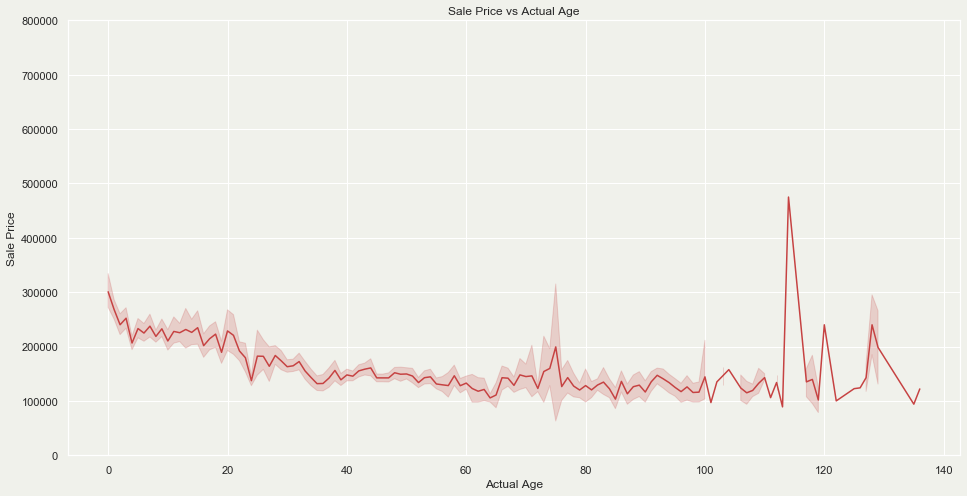

In [222]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.lineplot(x='actual_age', y="SalePrice", data=ames_df, color = '#c64242')
fig.axis(ymin=0, ymax=800000)
ax.set_title('Sale Price vs Actual Age', fontsize=12)
ax.set_xlabel('Actual Age', fontsize=12)
ax.set_ylabel('Sale Price', fontsize=12)

#### Actual age is calculated as Year Sold - Year Built. If we exclude the outlier, newer houses have a higher selling price. 

## Effective Age and Actual Age

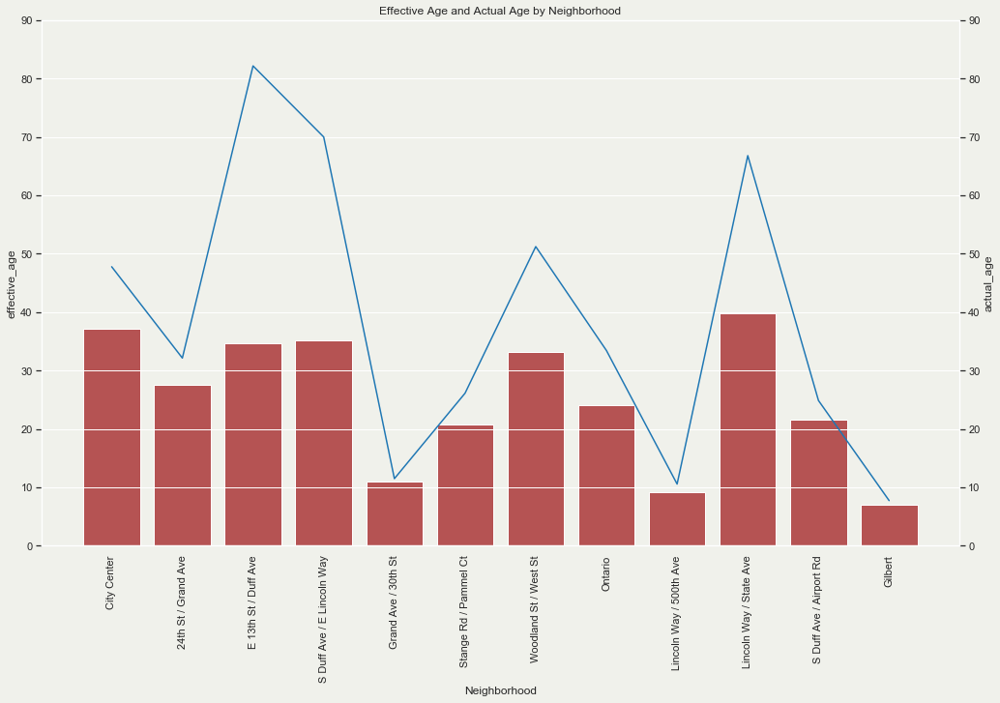

In [116]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
fig, ax1 = plt.subplots(figsize=(17,10))
color = 'tab:green'
#bar plot creation
ax1.set_title('Effective Age and Actual Age by Neighborhood', fontsize=12)
ax1.set_xlabel('Neighborhood', fontsize=12)
ax1.set_ylabel('Effective Age', fontsize=12)
ax1 = sns.barplot(x='Neighborhood', y='effective_age', data = ames_geo_mean_df2, color = '#c64242')
ax1.set_ylim(0,90)
plt.xticks(rotation=90)
#specify we want to share the same x-axis
ax2 = ax1.twinx()
color = 'tab:blue'
#line plot creation
ax2.set_ylabel('Actual Age', fontsize=12)
ax2 = sns.lineplot(x='Neighborhood', y='actual_age', data = ames_geo_mean_df2, sort=False, color=color)
ax2.set_ylim(0,90)
#show plot
plt.show()

#### Notes:

In [98]:
ames_df2['effective_age'] = ames_df2['YrSold'] - ames_df2['YearRemodAdd']
ames_df2['actual_age'] = ames_df2['YrSold'] - ames_df2['YearBuilt']
ames_df4 = ames_df2.groupby(['Neighborhood_New'])['effective_age', 'actual_age'].mean().reset_index()
ames_geo_mean_df2 = pd.merge(nbh_geo_df, ames_df4, left_on = 'Neighborhood', right_on='Neighborhood_New')
ames_geo_mean_df2

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  This is separate from the ipykernel package so we can avoid doing imports until


,Neighborhood,geometry,Neighborhood_New,effective_age,actual_age
0,City Center,"POLYGON ((-93.62326 42.06548, -93.62051 42.055...",City Center,37.134940,47.780723
1,24th St / Grand Ave,"POLYGON ((-93.62068 42.04579, -93.64017 42.045...",24th St / Grand Ave,27.483871,32.145161
2,E 13th St / Duff Ave,"POLYGON ((-93.63476 42.03450, -93.63373 42.033...",E 13th St / Duff Ave,34.746835,82.167722
3,S Duff Ave / E Lincoln Way,"POLYGON ((-93.57141 42.02896, -93.61656 42.023...",S Duff Ave / E Lincoln Way,35.134503,69.994152
4,Grand Ave / 30th St,"POLYGON ((-93.64240 42.05643, -93.63450 42.045...",Grand Ave / 30th St,10.962963,11.497942
5,Stange Rd / Pammel Ct,"POLYGON ((-93.64480 42.04540, -93.64480 42.035...",Stange Rd / Pammel Ct,20.806452,26.129032
6,Woodland St / West St,"POLYGON ((-93.65656 42.02819, -93.66840 42.028...",Woodland St / West St,33.149701,51.227545
7,Ontario,"POLYGON ((-93.69887 42.03457, -93.69905 42.022...",Ontario,24.116041,33.436860
8,Lincoln Way / 500th Ave,"POLYGON ((-93.69887 42.02245, -93.69879 42.014...",Lincoln Way / 500th Ave,9.175000,10.570833
9,Lincoln Way / State Ave,"POLYGON ((-93.65905 42.02252, -93.65888 42.007...",Lincoln Way / State Ave,39.745098,66.803922


## Average House Age by Neighborhood

In [153]:
import folium
from branca.colormap import linear


nbh_count_colormap3 = linear.YlGnBu_09.scale(min(ames_geo_mean_df2['effective_age']),
                                            max(ames_geo_mean_df2['effective_age']))

nbh_locs_map3 = folium.Map(location=[42.045042, -93.6473567],
                          zoom_start = 11.5, tiles='cartodbpositron')

style_function = lambda x: {
    'fillColor': nbh_count_colormap2(x['properties']['effective_age']),
    'color': 'black',
    'weight': 2,
    'fillOpacity': 0.7
}

folium.GeoJson(
    ames_geo_mean_df2,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Neighborhood_New', 'effective_age'],
        aliases=['Neighborhood', 'Sales Price per Square Feet'],
        localize=True
    )
).add_to(nbh_locs_map3)

nbh_count_colormap3.add_to(nbh_locs_map3)
nbh_count_colormap3.caption = 'Average Effective House Age by Neighborhood'
nbh_count_colormap3.add_to(nbh_locs_map3)
folium.map.CustomPane('labels').add_to(nbh_locs_map3)
folium.TileLayer('CartoDBPositronOnlyLabels',
                 pane='labels').add_to(nbh_locs_map3)
nbh_locs_map3

# House Features

## Basement

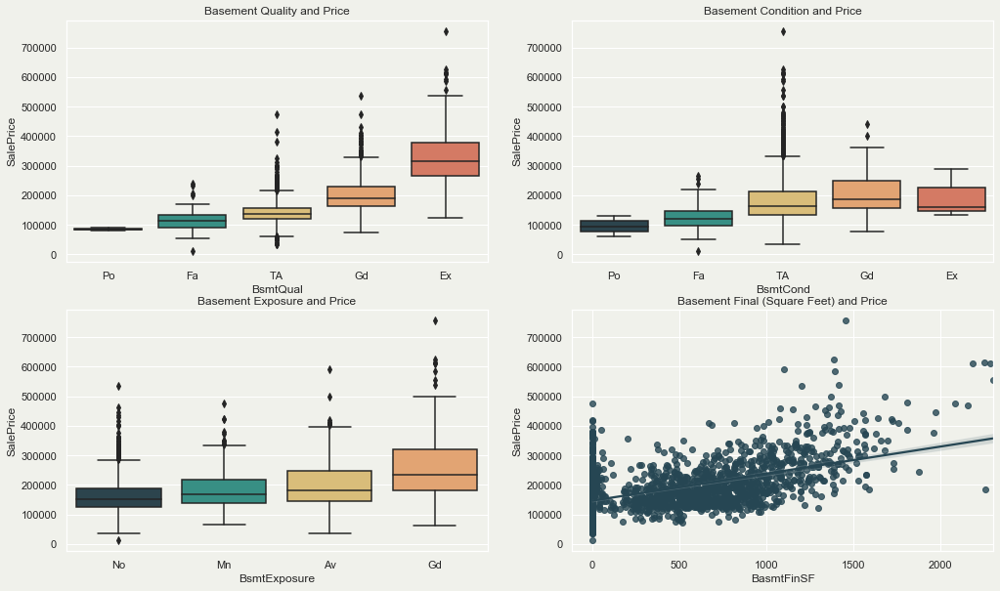

In [152]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))


plt.figure(figsize = (17,10))

plt.subplot(2,2,1).set_title("Basement Quality and Price")
sns.boxplot(x = 'BsmtQual', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = housing)

plt.subplot(2,2,2).set_title("Basement Condition and Price")
sns.boxplot(x = 'BsmtCond', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = housing)

plt.subplot(2,2,3).set_title("Basement Exposure and Price")
sns.boxplot(x = 'BsmtExposure', y = 'SalePrice', order=["No","Mn","Av","Gd"], data = housing)

plt.subplot(2,2,4).set_title("Basement Final (Square Feet) and Price")
sns.regplot(x = 'BasmtFinSF', y = 'SalePrice', data = housing)

#### Greater quality and greater size of the basement are related to higher sale price. 

## Kitchen

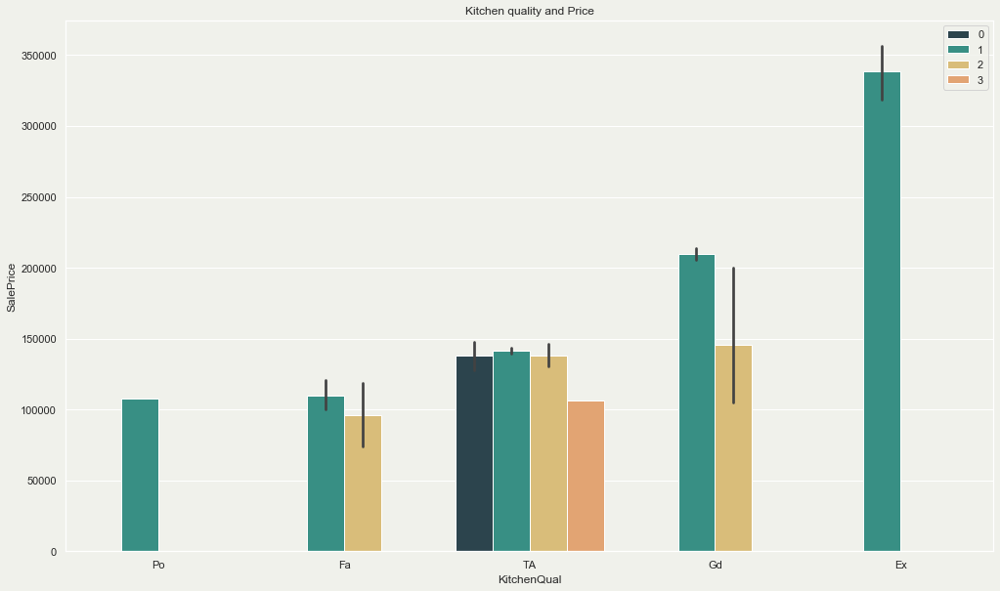

In [151]:
plt.figure(figsize = (17,10))
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
plt.title('Kitchen quality and Price')
sns.barplot(x = 'KitchenQual', y = 'SalePrice', data = ames_df, \
            order=["Po","Fa","TA","Gd", "Ex"], hue = 'KitchenAbvGr').legend(loc='upper right')


- Higher kitchen quality could increase house price
- Price has no significant difference in number of kitchen with same quality.

## Garage

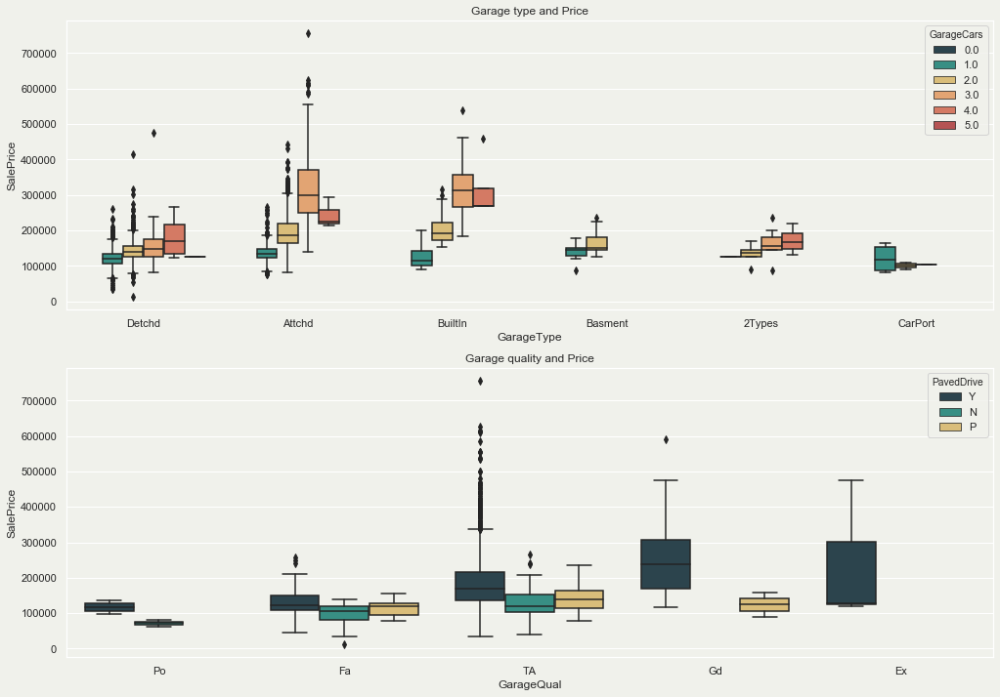

In [149]:
plt.figure(figsize = (17,12))
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))

plt.subplot(2,1,1).set_title("Garage type and Price")
sns.boxplot(x = 'GarageType', y = 'SalePrice', hue = 'GarageCars',\
            data = ames_df)

plt.subplot(2,1,2).set_title("Garage quality and Price")
sns.boxplot(x = 'GarageQual', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], hue = 'PavedDrive',\
            data = ames_df)

- Garage with good and excellent quality, they do have paved drive way and higher house price
- Paved drive way has higher house price compare to no paved for the same garage quality

## Bathroom

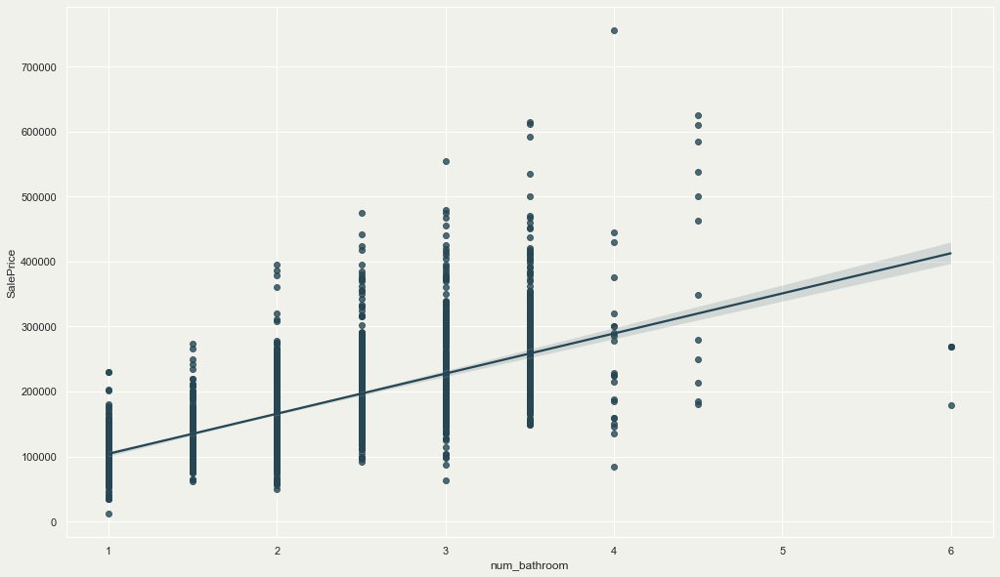

In [145]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
fig, ax1 = plt.subplots(figsize=(17,10))
sns.regplot(x = 'num_bathroom', y = 'SalePrice', color = '#264653', data = housing)

#### The graph shows that there is a relationship between number of bathrooms and sale price

# Other Interior Features:

## Electricity, Heating, Central Air, and Fireplace

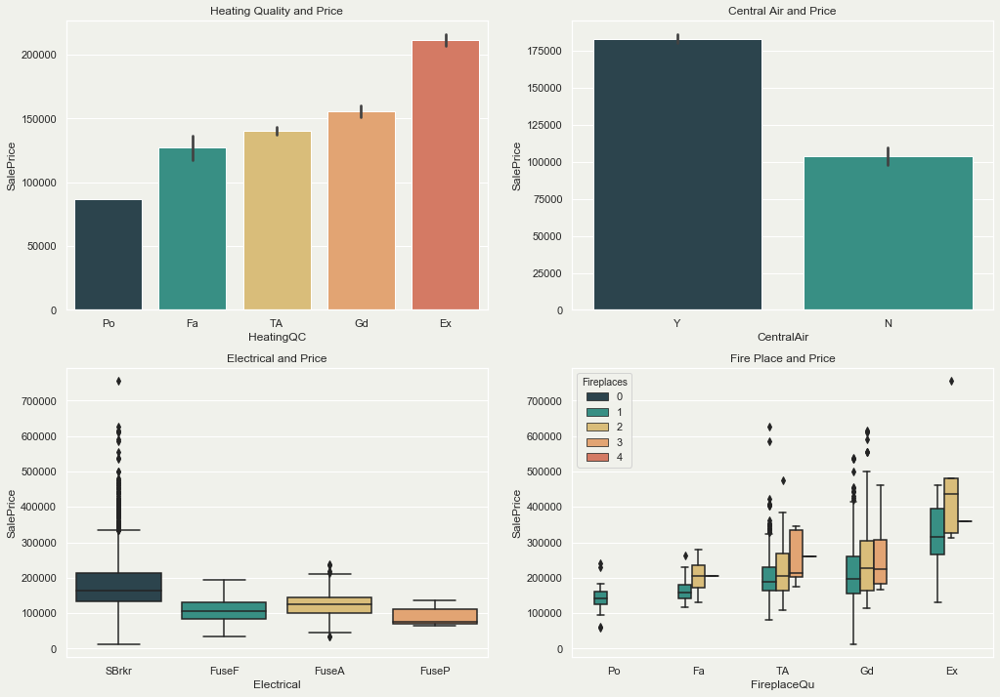

In [170]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51"]
sns.set_palette(sns.color_palette(colors))

plt.figure(figsize = (17,12))

plt.subplot(2,2,1).set_title("Heating Quality and Price")
sns.barplot(x = 'HeatingQC', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = ames_df)

plt.subplot(2,2,2).set_title("Central Air and Price")
sns.barplot(x = 'CentralAir', y = 'SalePrice', data = housing)

plt.subplot(2,2,3).set_title("Electrical and Price")
sns.boxplot(x = 'Electrical', y = 'SalePrice', data = housing)

plt.subplot(2,2,4).set_title("Fire Place and Price")
sns.boxplot(x = 'FireplaceQu', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], hue = 'Fireplaces',\
            data = ames_df)

- Having better heating quality is related to higher sale price
- Having central air is related to higher sale price
- Having more and having better quality of fire place is related to higher sale price

# Other Exterior Features

 ### Land Slope, Building Type, Porch, Roof Style

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


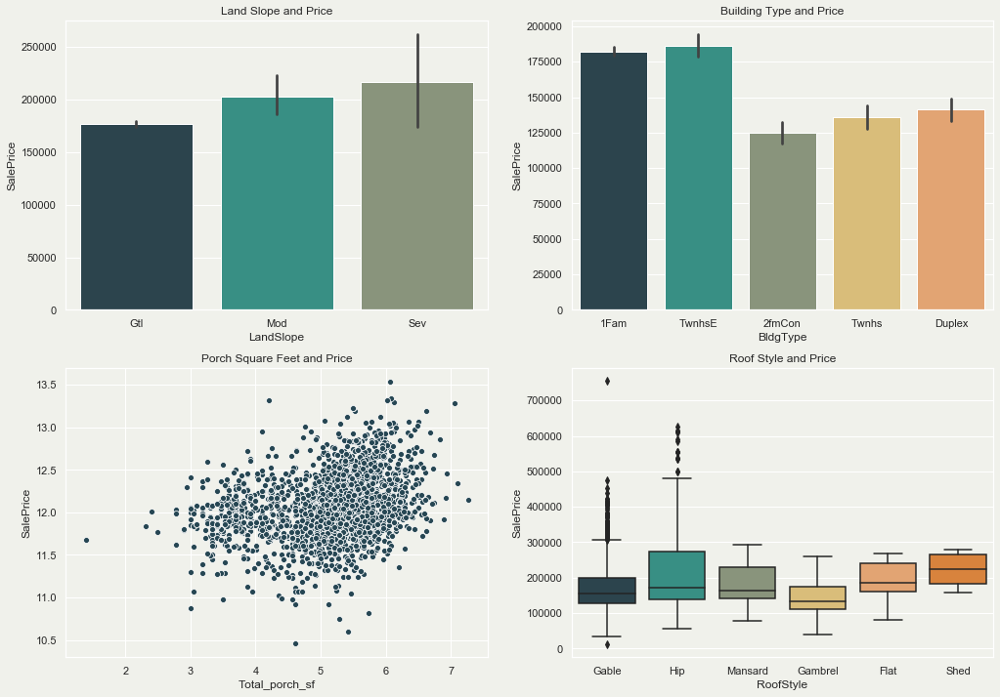

In [224]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#899878","#e9c46a", "#f4a261", "#F28123", "#e76f51","#563F1B"]
sns.set_palette(sns.color_palette(colors))


log_porch = np.log(ames_df['Total_porch_sf'])
log_SalePrice= np.log(ames_df['SalePrice'])

plt.figure(figsize = (17,10))



plt.subplot(2,2,1).set_title("Land Slope and Price")
sns.barplot(x = 'LandSlope', y = 'SalePrice', data = ames_df)

plt.subplot(2,2,2).set_title("Building Type and Price")
sns.barplot(x = 'BldgType', y = 'SalePrice', data = ames_df)

plt.subplot(2,2,3).set_title("Porch Square Feet and Price")
sns.scatterplot(x = log_porch, y = log_SalePrice, data = ames_df)

plt.subplot(2,2,4).set_title("Roof Style and Price")
sns.boxplot(x = 'RoofStyle', y = 'SalePrice', data = ames_df)

- Houses that are on the steeper hill seem to be more expensive
- End-unit town houses seem to be significantly more expensive than in-unit town houses
- Duplexes are more expensive than 2 family conversion
- Houses with a shed roof style are associated with higher median sale price
- Houses with greater porch area is associated with higher sale price

# Masonry Veneer, Foundation, Exterior Condition and Quality

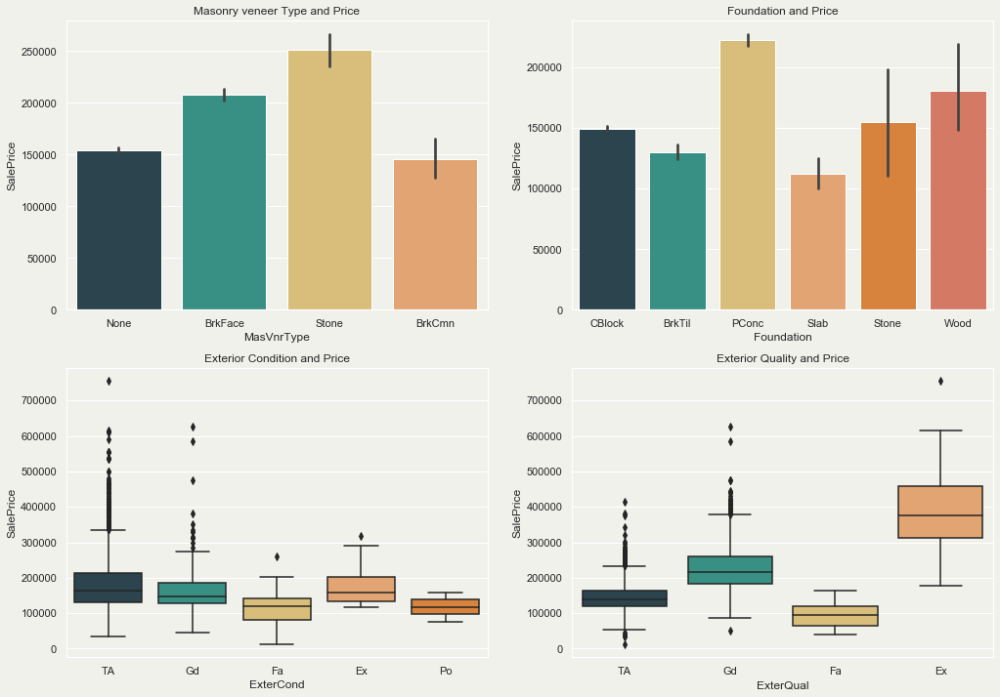

In [171]:
sns.set(rc={'axes.facecolor':'#F0F1EB', 'figure.facecolor':'#F0F1EB'})
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#F28123", "#e76f51","#563F1B"]
sns.set_palette(sns.color_palette(colors))

plt.figure(figsize = (17,12))

plt.subplot(2,2,1).set_title("Masonry veneer Type and Price")
sns.barplot(x = 'MasVnrType', y = 'SalePrice', data = ames_df)

plt.subplot(2,2,2).set_title("Foundation and Price")
sns.barplot(x = 'Foundation', y = 'SalePrice', data = ames_df)

plt.subplot(2,2,3).set_title("Exterior Condition and Price")
sns.boxplot(x = 'ExterCond', y = 'SalePrice', data = ames_df)

plt.subplot(2,2,4).set_title("Exterior Quality and Price")
sns.boxplot(x = 'ExterQual', y = 'SalePrice', data = ames_df)

#### Notes

# Descriptive Model

In [225]:
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV, ElasticNet, ElasticNetCV, HuberRegressor
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict,cross_validate, GridSearchCV, train_test_split
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor 
import statistics
import matplotlib.pyplot as plt
import seaborn as sns

In [226]:
ames_df = pd.read_csv('./data/final_df.csv', index_col = 0)

# Checking final_df after generating geoCode, found duplicated observations
ames_df.shape

(2603, 179)

In [227]:
# drop duplicated observations
ames_df = ames_df.drop_duplicates(subset=['PID'],keep = 'first')
ames_df.shape

(2558, 179)

In [228]:
ames_df_use = ames_df.copy()

# convert MSSubClass to str
ames_df_use['MSSubClass'] = ames_df_use[['MSSubClass']].astype('str')

# characterize tax distr and sch distr
ames_df_use['TxD_S'] = ames_df_use[['TxD_S']].astype('str')
ames_df_use['SchD_S'] = ames_df_use[['SchD_S']].astype('str')

# convert NA's to 0s in LotFrontage and Alley
ames_df_use['LotFrontage'] = np.where(pd.isnull(ames_df_use['LotFrontage']), 0, ames_df_use['LotFrontage'])
ames_df_use['Alley'] = np.where(pd.isnull(ames_df_use['Alley']), 0, 1)

# Impute None to Nan value in columns
none_features = ['FireplaceQu','GarageType','GarageFinish','GarageQual','GarageCond','Fence','BsmtQual','BsmtCond']
for feature in none_features:
    ames_df_use[feature] = ames_df_use[feature].fillna('None')

# drop rows with NA garage car / garage area
garage_NA_index = ames_df_use.loc[pd.isnull(ames_df_use['GarageArea'])].index
ames_df_use = ames_df_use.drop(garage_NA_index,axis=0)

# add in proper bathroom numbers for 918 and 2328
ames_df_use.at[918, 'num_bathroom'] = 1
ames_df_use.at[2328, 'num_bathroom'] = 3.5

# remove unnecessary columns
ames_df_use = ames_df_use.drop(
    ['PA-PreD','PA-PostD','PA-UnTyp','PA-UntNo','X1TPr_D','X1TSc_D','Rcrd_Mo','Legal_Pr','TxD_S',\
    'X2TPr_D','X2TSc_D','X1TPr_S','X1TSc_S','X2TPr_S','X2TSc_S','ISU_lat_long','address','MA_Ownr1','MA_Ownr2',\
    'MA_Line1','MA_Line2','MA_City','MA_State','address3','location2','point2','SaleCond','Source','Date',\
    'ParType','BldgNo_S','DwlgNo_S','YrBuilt','Ext1','Ext2','GLA','GarYrBlt','Cars','MA_Zip1','MA_Zip2',\
    'ZngCdPr','ZngCdSc','ZngOLPr','ZngOLSc','PA-Nmbr','PA-Strt','PA-StSfx','Inst1_No','Inst1_Yr','Inst1_Mo',\
    'Inst1TPr','TtlVal_AsrYr','ValType','OthAc_S','ImpAc_S','LndAc_S','Prop_Addr','HSTtl_D','MilVal_D',\
    'HSTtl_S','MilVal_S','GeoRefNo','Tier','Range','AcreX_S1','ClassPr_S','ClassSc_S','LndAcX1S','ImpAcX1S',\
    'Central Air','ImpAcX2S','AcreGr','AcreNt_S','ParclRel','Rcrd_Yr','address2','SaleType',\
    'latitude2','longitude2','ISU_lat','ISU_long','altitude2','Central Air',\

    'index','MiscVal','YrSold_YYYY','MoSold_MM','PoolArea','PoolQC','MiscFeature','Street','PID','Utilities',\
    'BsmtHalfBath2','FullBath','HalfBath','TtlBsmtSF','HalfBath2','BsmtFullBath','BsmtHalfBath',\
    'BsmtFinSF1','BsmtFinSF2','BsmtFinType1','BsmtFinType2','BsmtUnfSF','LowQualFinSF','BasmtFinSF2','BasmtFinSF1',\
    'GrLivArea','1stFlrSF','2ndFlrSF','BedroomAbvGr','MasVnrType','MasVnrArea','GarageArea2','PoolArea2','NmbrBRs',\
    'Neighborhood','TotalBsmtSF','GarageYrBlt','BasmtFinSF','Heating'],\
    axis=1)

print(ames_df_use.columns)
print(f'has null: {ames_df_use.columns[ames_df_use.isnull().sum() > 0]}')

Index(['SalePrice', 'Distance', 'MSSubClass', 'MSZoning', 'LotFrontage',
       'LotArea', 'Alley', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'HeatingQC', 'CentralAir',
       'Electrical', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'Fence', 'MoSold', 'YrSold', 'SaleCondition',
       'MasVnrArea2', 'total_LivArea', 'num_bathroom', 'SchD_S'],
      dtype='object')
has null: Index(['BsmtExposure', 'Electrical'], dtype='object')


In [229]:
ames_df_use.YrSold.value_counts()

2007    595
2009    576
2008    561
2006    511
2010    314
Name: YrSold, dtype: int64

In [230]:
# one way ANOVA test
SalePr_YrSold = ames_df_use[['YrSold','SalePrice']]
from scipy.stats import f_oneway
f_oneway(SalePr_YrSold.loc[SalePr_YrSold['YrSold']==2006]['SalePrice'],
         SalePr_YrSold.loc[SalePr_YrSold['YrSold']==2007]['SalePrice'],
         SalePr_YrSold.loc[SalePr_YrSold['YrSold']==2008]['SalePrice'],
         SalePr_YrSold.loc[SalePr_YrSold['YrSold']==2009]['SalePrice'],
         SalePr_YrSold.loc[SalePr_YrSold['YrSold']==2010]['SalePrice'])

F_onewayResult(statistic=0.4853231382751426, pvalue=0.7465518551782976)

In [231]:
# dummify the dataset
orig_dum = pd.get_dummies(ames_df_use, drop_first=True)
print(orig_dum.shape)

# apply log()
orig_dum['SalePrice'] = np.log(orig_dum['SalePrice'])
orig_dum['total_LivArea'] = np.log(orig_dum['total_LivArea'])
orig_dum['LotFrontage'] = np.log(orig_dum['LotFrontage']+1)
orig_dum['WoodDeckSF'] = np.log(orig_dum['WoodDeckSF']+1)
orig_dum['OpenPorchSF'] = np.log(orig_dum['OpenPorchSF']+1)
orig_dum['EnclosedPorch'] = np.log(orig_dum['EnclosedPorch']+1)
orig_dum['3SsnPorch'] = np.log(orig_dum['3SsnPorch']+1)
orig_dum['ScreenPorch'] = np.log(orig_dum['ScreenPorch']+1)

(2557, 201)


In [232]:
train_orig = orig_dum[orig_dum['YrSold']!=2010]
test_orig = orig_dum[orig_dum['YrSold']==2010]
print(train_orig.shape)
print(test_orig.shape)

X_train_orig = train_orig.drop(['SalePrice','YrSold'],axis=1)
y_train_orig = train_orig['SalePrice']
X_test_orig = test_orig.drop(['SalePrice','YrSold'],axis=1)
y_test_orig = test_orig['SalePrice']

(2243, 201)
(314, 201)


In [233]:
lin_reg = LinearRegression().fit(X_train_orig, y_train_orig)
lin_reg.score(X_train_orig, y_train_orig)

x_feature = sm.add_constant(X_train_orig)

model = sm.OLS(y_train_orig, x_feature)
results_feature = model.fit()
print(results_feature.summary())
pValue = results_feature.pvalues
pValue[pValue<0.05]

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.932
Model:                            OLS   Adj. R-squared:                  0.926
Method:                 Least Squares   F-statistic:                     146.7
Date:                Sun, 29 Nov 2020   Prob (F-statistic):               0.00
Time:                        22:46:12   Log-Likelihood:                 1991.9
No. Observations:                2243   AIC:                            -3598.
Df Residuals:                    2050   BIC:                            -2495.
Df Model:                         192                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     4.71

const                    1.217777e-13
Distance                 2.247028e-08
LotArea                  3.006918e-15
OverallQual              6.107765e-66
OverallCond              7.502397e-34
                             ...     
PavedDrive_Y             2.872318e-02
SaleCondition_Family     7.189929e-03
SaleCondition_Normal     1.872588e-03
SaleCondition_Partial    5.496961e-06
SchD_S_5                 3.439207e-02
Length: 71, dtype: float64

# Feature Engineering

- Building Age
- Remodeled
- IsPUD
- LotIsReg
- HillORDepr
- PosFeat
- Extmatl
- TotalPorchSF
- HasFence
- Funct_3

- Building Age
- Remodeled

- IsPUD

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

- LotIsReg
- HillORDepr
- PosFeat
- HasFence

- Extmatl

- TotalPorchSF

- Funct_3

       Typ	Typical Functionality
       Min1	Minor Deductions 1
       Min2	Minor Deductions 2
       Mod	Moderate Deductions
       Maj1	Major Deductions 1
       Maj2	Major Deductions 2
       Sev	Severely Damaged
       Sal	Salvage only

In [234]:
def feature_eng(df):
    # calculate age of building
    df['BldgAge'] = df['YrSold'] - df['YearBuilt']
    #effectiveage: df['BldgAge'] = df['YearBuilt'] - df['YearRemodAdd']

    # binarize YearRemodAdd
    df['Remodeled'] = np.where(df['YearRemodAdd'] == df['YearBuilt'], 0, 1)

    # binarize MSSubClass to PUD or not PUD
    df['IsPUD'] = np.where(df['MSSubClass'].isin(['120','150','160','180']), 1, 0)
    
    # binarize LotShape to Reg/not Reg
    df['LotIsReg'] = np.where(df['LotShape']=='Reg', 1, 0)
    
    # binarize LandContour to HLS and Low vs not HLS or Low
    df['HillORDepr'] = np.where(df['LandContour'].isin(['HLS','Low']), 1, 0)
    
    # binarize Condition1/2 to positive feature or no positive feature
    df['PosFeat'] = np.where(df['Condition1'].isin(['PosN','PosA'])|df['Condition2'].isin(['PosN','PosA']), 1, 0)
    
    # combine exterior material 1/2 to one column
    df['ExtMatl'] = np.where((df['Exterior1st']==df['Exterior2nd']),df['Exterior1st'], 'Mixed')
    
    # simply qual/cond features
    for col in ['ExterQual','BsmtQual','KitchenQual','FireplaceQu','GarageQual','ExterCond',\
                'BsmtCond','GarageCond','HeatingQC']:
        df[col+'_num'] = df[col].replace(['Ex','Gd','TA','Fa','Po','None'],[10,8,6,4,2,0])

    # sum up porch/housefront area
    df['TotalPorchSF'] = df['OpenPorchSF'] + df['3SsnPorch'] + df['EnclosedPorch'] +\
                                df['ScreenPorch'] + df['WoodDeckSF']
    
    # binarize fences to having a fence or not having a fence
    df['HasFence'] = np.where(df['Fence']=='None', 0, 1)

    # simplify Functional to 3 classes
    df['Funct_3'] = df['Functional'].replace(['Maj1', 'Maj2', 'Min1', 'Min2', 'Mod', 'Sal', 'Typ'],\
                                             ['ModToSev','ModToSev','Minor','Minor','ModToSev','ModToSev','Normal'])
    
    # drop the original columns or unused columns
    df = df.drop(['MSSubClass','YearBuilt','YearRemodAdd','LotFrontage','LotArea','LotConfig','LandSlope',\
                  'Condition1','Condition2','Exterior1st','Exterior2nd','LotShape','LandContour',\
                  'OpenPorchSF','3SsnPorch','EnclosedPorch','ScreenPorch','WoodDeckSF',\
                  'Fence','Functional','ExterQual','BsmtQual','KitchenQual','FireplaceQu',\
                  'GarageQual','ExterCond','BsmtCond','GarageCond','HeatingQC',\
                  'GarageCars','RoofStyle','RoofMatl','KitchenAbvGr'],\
                 axis = 1)
    return df

In [235]:
ames_df_eng = feature_eng(ames_df_use)

In [236]:
# dummify the dataset
ames_df_dum = pd.get_dummies(ames_df_eng, drop_first=True)
print(ames_df_dum.shape)
print(ames_df_dum.shape)

# apply log()
ames_df_dum['SalePrice'] = np.log(ames_df_dum['SalePrice'])
ames_df_dum['total_LivArea'] = np.log(ames_df_dum['total_LivArea'])
#ames_df_dum['Distance'] = np.log(X_train_dum['Distance'])
ames_df_dum['TotalPorchSF'] = np.log(ames_df_dum['TotalPorchSF']+1)

(2557, 89)
(2557, 89)


In [237]:
train = ames_df_dum[ames_df_dum['YrSold']!=2010]
test = ames_df_dum[ames_df_dum['YrSold']==2010]
print(train.shape)
print(test.shape)

X_train = train.drop(['SalePrice','YrSold'],axis=1)
y_train = train['SalePrice']
X_test = test.drop(['SalePrice','YrSold'],axis=1)
y_test = test['SalePrice']

(2243, 89)
(314, 89)


In [238]:
lin_reg = LinearRegression().fit(X_train, y_train)
lin_reg.score(X_train, y_train)

x_feature = sm.add_constant(X_train)

model = sm.OLS(y_train, x_feature)
results_feature = model.fit()
print(results_feature.summary())
pValue = results_feature.pvalues
pValue[pValue<0.05]

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.917
Model:                            OLS   Adj. R-squared:                  0.914
Method:                 Least Squares   F-statistic:                     273.8
Date:                Sun, 29 Nov 2020   Prob (F-statistic):               0.00
Time:                        23:03:32   Log-Likelihood:                 1766.5
No. Observations:                2243   AIC:                            -3357.
Df Residuals:                    2155   BIC:                            -2854.
Df Model:                          87                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     8.27

const                     0.000000e+00
Distance                  2.039749e-05
OverallQual               9.004325e-74
OverallCond               3.116463e-41
TotRmsAbvGrd              5.627140e-33
Fireplaces                3.621850e-09
GarageArea                5.232993e-32
total_LivArea            2.016258e-101
num_bathroom              8.279832e-05
BldgAge                   1.790871e-06
LotIsReg                  2.159964e-02
HillORDepr                5.137700e-06
ExterQual_num             1.384016e-02
BsmtQual_num              7.967216e-07
KitchenQual_num           6.237743e-06
HeatingQC_num             2.090769e-04
TotalPorchSF              9.436876e-03
MSZoning_FV               7.411762e-12
MSZoning_I (all)          4.612259e-02
MSZoning_RH               6.659612e-04
MSZoning_RL               2.871565e-09
MSZoning_RM               2.604717e-05
BldgType_2fmCon           4.027566e-03
BldgType_Duplex           9.304687e-10
BldgType_Twnhs            1.271284e-02
HouseStyle_2Story        

In [241]:
print(lin_reg.score(X_train, y_train))
print(lin_reg.score(X_test, y_test))

0.9170440020274087
0.8548036170140825


# Predictive Model

### Decision Tree

R^2 of Train set: 0.9372210182557982
R^2 Test set: 0.7628019395334732
          feature  importance
0   b'OverallQua'    0.574188
1   b'total_LivA'    0.278441
2   b'num_bathro'    0.031951
3   b'GarageArea'    0.024397
4   b'MSZoning_R'    0.013630
5   b'Fireplaces'    0.010047
6     b'Distance'    0.008496
7      b'BldgAge'    0.007884
8   b'BsmtQual_n'    0.006559
9   b'OverallCon'    0.006192
10  b'TotalPorch'    0.005811
11  b'HeatingQC_'    0.002744
12  b'SaleCondit'    0.002729
13  b'SaleCondit'    0.002344
14      b'MoSold'    0.002286
15  b'TotRmsAbvG'    0.002160
16  b'Funct_3_No'    0.001807
17  b'ExterQual_'    0.001729
18  b'PavedDrive'    0.001591
19  b'FireplaceQ'    0.001541
CPU times: user 4.56 s, sys: 359 ms, total: 4.92 s
Wall time: 4.95 s
Grid Search Best Parameters: {'criterion': 'mse', 'min_samples_leaf': 8, 'min_samples_split': 28}
Grid Search Best Scores: 0.8272300505871548
Grid Search R2 of Train set: 0.8984587281969567
Grid Search R2 of Test set: 0.79856388499

<Figure size 1224x720 with 0 Axes>

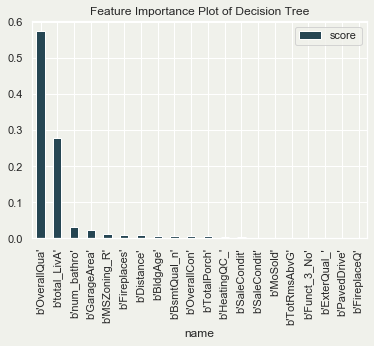

In [248]:
# Decision Tree Model
tree_reg = DecisionTreeRegressor(max_depth=8).fit(X_train,y_train)
print(f'R^2 of Train set: {tree_reg.score(X_train,y_train)}')
print(f'R^2 Test set: {tree_reg.score(X_test,y_test)}')
plt.figure(figsize = (17,10))
feature_importance_tree = list(zip(X_train.columns ,tree_reg.feature_importances_))
dtype = [('feature', 'S10'), ('importance', 'float')]
feature_importance_tree = np.array(feature_importance_tree, dtype=dtype)
feature_sort_tree = np.sort(feature_importance_tree, order = 'importance')[::-1]
name, score = zip(*list(feature_sort_tree))
print(pd.DataFrame(feature_sort_tree[:20]))
pd.DataFrame({'name':name,'score':score})[:20].plot.bar(x='name', y='score')
plt.title('Feature Importance Plot of Decision Tree')


from sklearn.model_selection import GridSearchCV
grid_para_tree = [{
    "criterion": ['mse'],
    "min_samples_leaf": range(1, 10),
    "min_samples_split": np.linspace(start=2, stop=30, num=15, dtype=int)
}]
tree_reg.set_params(random_state=42)
grid_search_tree = GridSearchCV(tree_reg, grid_para_tree, cv=10, scoring='r2', n_jobs=-1)
%time grid_search_tree.fit(X_train, y_train)

print(f'Grid Search Best Parameters: {grid_search_tree.best_params_}')

print(f'Grid Search Best Scores: {grid_search_tree.best_score_}')

print(f'Grid Search R2 of Train set: {grid_search_tree.score(X_train,y_train)}')
print(f'Grid Search R2 of Test set: {grid_search_tree.score(X_test,y_test)}')

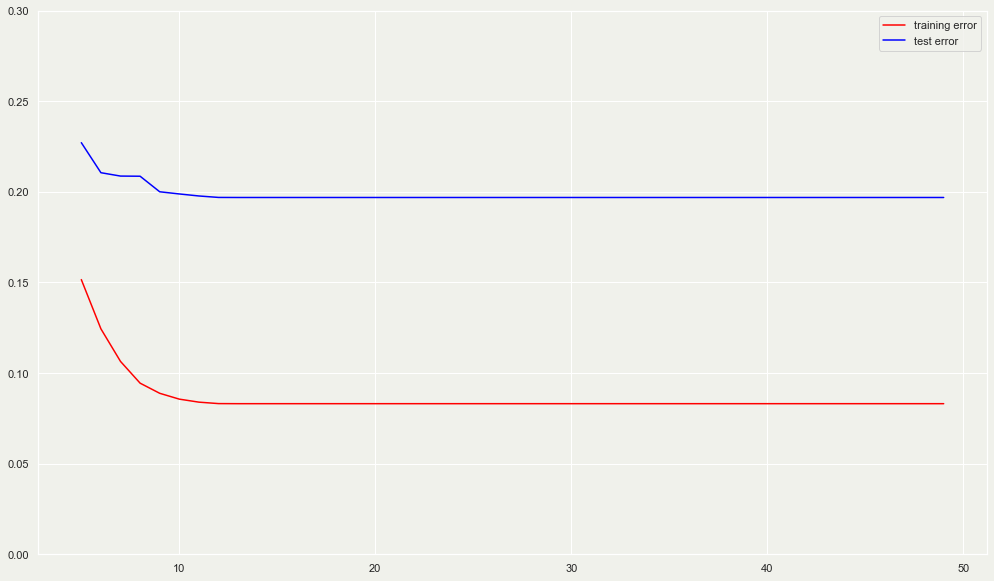

In [245]:
depth = range(5, 50)
train_error = []
test_error = []
for i in depth:
    tree_reg.set_params(max_depth=i, min_samples_leaf=9)
    tree_reg.fit(X_train, y_train)
    train_error.append(1 - tree_reg.score(X_train, y_train))
    test_error.append(1 - tree_reg.score(X_test, y_test))

plt.figure(figsize = (17,10))
plt.plot(depth, train_error, c='red', label='training error')
plt.plot(depth, test_error, c='blue', label='test error')
plt.ylim(0, 0.30)
plt.legend()
plt.show()

### Random Forest Model

R^2 of Train set: 0.9836399247149201
R^2 Test set: 0.820979876888416
          feature  importance
0   b'total_LivA'    0.100916
1   b'OverallQua'    0.092241
2      b'BldgAge'    0.073421
3   b'FireplaceQ'    0.061487
4   b'ExterQual_'    0.058094
5   b'GarageArea'    0.055934
6   b'BsmtQual_n'    0.046623
7   b'KitchenQua'    0.042876
8   b'num_bathro'    0.041618
9   b'Fireplaces'    0.039186
10  b'TotRmsAbvG'    0.033295
11  b'TotalPorch'    0.026741
12    b'Distance'    0.021128
13  b'OverallCon'    0.018578
14  b'HeatingQC_'    0.017709
15  b'GarageCond'    0.016482
16  b'Foundation'    0.015188
17  b'GarageType'    0.014438
18  b'GarageType'    0.013268
19  b'GarageFini'    0.012890
CPU times: user 29.4 s, sys: 1.73 s, total: 31.1 s
Wall time: 1min 33s
Grid Search Best Parameters: {'criterion': 'mse', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': 42}
Grid Search Best Scores: 0.8799421088003339
Grid Search R2 of Train set: 0.9821997479827305


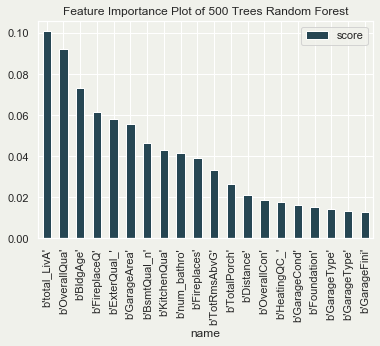

In [249]:
# Random Forest Model
forest_reg = RandomForestRegressor(n_estimators=100,max_features=5).fit(X_train,y_train)
print(f'R^2 of Train set: {forest_reg.score(X_train,y_train)}')
print(f'R^2 Test set: {forest_reg.score(X_test,y_test)}')


feature_importance_forest = list(zip(X_train.columns, forest_reg.feature_importances_))
feature_importance_forest = np.array(feature_importance_forest, dtype=dtype)
feature_sort_forest = np.sort(feature_importance_forest, order='importance')[::-1]
name, score = zip(*list(feature_sort_forest))
print(pd.DataFrame(feature_sort_forest[:20]))
pd.DataFrame({'name':name,'score':score})[:20].plot.bar(x='name', y='score')
plt.title('Feature Importance Plot of 500 Trees Random Forest')


grid_para_forest = [{
    "n_estimators": [25,50,100],
    "criterion": ["mse"],
    "min_samples_leaf": range(1, 10),
    "min_samples_split": np.linspace(start=2, stop=30, num=15, dtype=int),
    "random_state": [42]}]
grid_search_forest = GridSearchCV(forest_reg, grid_para_forest, cv=10, scoring='r2', n_jobs=-1)
%time grid_search_forest.fit(X_train, y_train)

print(f'Grid Search Best Parameters: {grid_search_forest.best_params_}')

print(f'Grid Search Best Scores: {grid_search_forest.best_score_}')

print(f'Grid Search R2 of Train set: {grid_search_forest.score(X_train,y_train)}')
print(f'Grid Search R2 of Test set: {grid_search_forest.score(X_test,y_test)}')

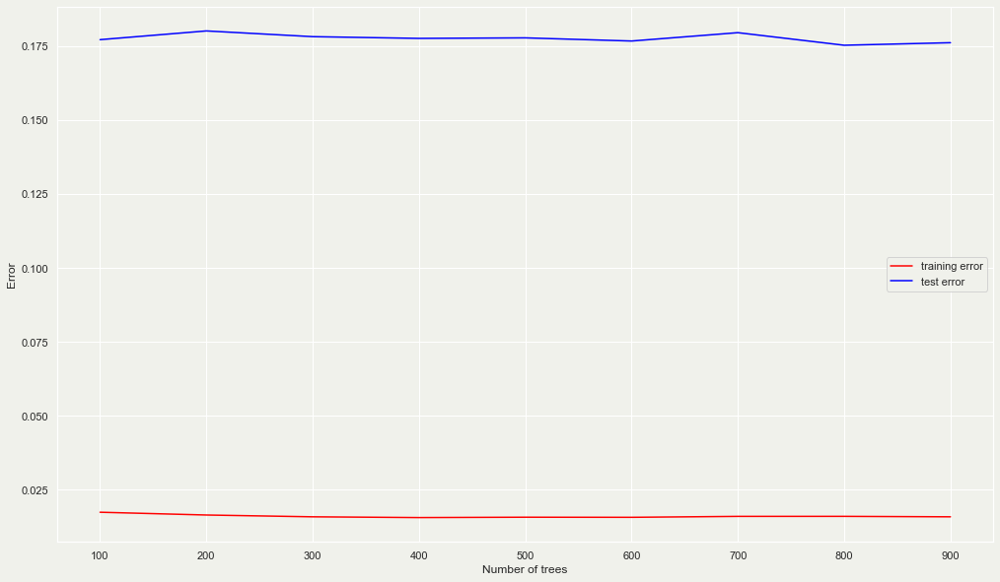

In [251]:
n_trees_range = range(100, 1000, 100)  # OOB score will warning if too few trees
train_error2 = []
test_error2 = []


for n_trees in n_trees_range:
    forest_reg.set_params(n_estimators=n_trees)
    forest_reg.fit(X_train, y_train)
    train_error2.append(1 - forest_reg.score(X_train, y_train))
    test_error2.append(1 - forest_reg.score(X_test, y_test))
    
plt.figure(figsize = (17,10))
plt.plot(n_trees_range, train_error2, c='red', label='training error')
plt.plot(n_trees_range, test_error2, c='blue', label='test error')
plt.ylabel('Error')
plt.xlabel('Number of trees')
plt.legend()
plt.show()

###  Gradient Boosting Model

R^2 of Train set: 0.17727216747782348
R^2 Test set: 0.15255671418740524
                    0         1
0         OverallQual  0.376689
1       total_LivArea  0.362510
2          GarageArea  0.054490
3     FireplaceQu_num  0.028728
4     KitchenQual_num  0.022786
5             BldgAge  0.022187
6         OverallCond  0.018398
7       ExterQual_num  0.015956
8         MSZoning_RM  0.012448
9        CentralAir_Y  0.012172
10       num_bathroom  0.011906
11       TotalPorchSF  0.006732
12       TotRmsAbvGrd  0.006358
13     GarageCond_num  0.005746
14         Fireplaces  0.005689
15       BsmtQual_num  0.004852
16      HeatingQC_num  0.004766
17        MSZoning_RL  0.004438
18           Distance  0.004154
19  GarageType_Attchd  0.003434


Text(0.5, 1.0, 'Feature Importance Plot of 1000-Tree GBM')

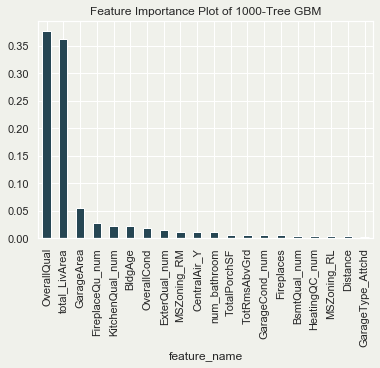

In [254]:
# Gradient Boosting Model

from sklearn.ensemble import GradientBoostingRegressor
gbm = GradientBoostingRegressor().fit(X_train,y_train)
gbm.set_params(learning_rate=0.01, n_estimators=5000, verbose=1, warm_start=False,loss='ls',max_features=2, min_impurity_decrease=0.01)

print(f'R^2 of Train set: {gbm.score(X_train,y_train)}')
print(f'R^2 Test set: {gbm.score(X_test,y_test)}')


sorted_importance_gbm = sorted(zip(X_train.columns, gbm.feature_importances_), key=lambda t:t[1], reverse=True)
print(pd.DataFrame(sorted_importance_gbm[:20]))
a, b = zip(*sorted_importance_gbm[:20]) # this splits the list of tuples into two lists
pd.DataFrame({'feature_name':a, 'importance_score':b}).plot.bar(x='feature_name',y='importance_score', legend=None)
plt.title('Feature Importance Plot of 1000-Tree GBM')


### Lasso Regression

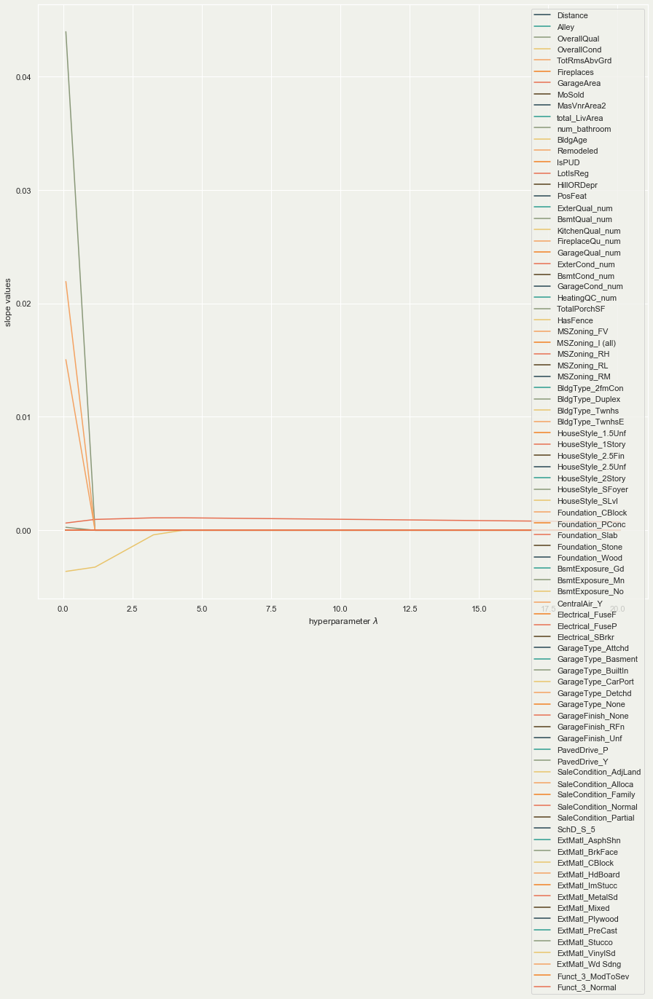

In [257]:
import numpy as np
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
lasso  = Lasso()
alphas = np.linspace(0.1,20.1,20)
lasso.set_params(normalize=False)
coefs_lasso  = []

for alpha in alphas:
        lasso.set_params(alpha=alpha)
        lasso.fit(X_train, y_train)  
        coefs_lasso.append(lasso.coef_)

coefs_lasso = pd.DataFrame(coefs_lasso, index = alphas, columns = X_train.columns)  
# coefs_lasso.head()
plt.figure(figsize=(15,15))
for name in coefs_lasso.columns:
    plt.plot(coefs_lasso.index, coefs_lasso[name], label=name)
plt.xlabel(r'hyperparameter $\lambda$')
plt.ylabel(r'slope values')
plt.legend(loc=1)   

In [260]:
reg_lasso_cv = LassoCV(normalize = True, n_alphas = 200)
reg_lasso_cv.fit(X_train, y_train)
print(reg_lasso_cv.alpha_)

reg_lasso = Lasso(normalize=True)
reg_lasso.set_params(alpha = 2.846e-05)
reg_lasso.fit(X_train, y_train)
lasso_coef_df = pd.DataFrame({'feature':X_train.columns,
                              'coef':reg_lasso.coef_})
lasso_coef_df[lasso_coef_df['coef']>0]

3.158590218274496e-05


,feature,coef
2,OverallQual,0.068616
3,OverallCond,0.036761
4,TotRmsAbvGrd,0.028648
5,Fireplaces,0.043930
6,GarageArea,0.000215
8,MasVnrArea2,0.007217
9,total_LivArea,0.290148
10,num_bathroom,0.018246
15,HillORDepr,0.048925
16,PosFeat,0.016757


# Conclusion

- To predict the house price, we will use linear regression model
- Housing price at Ames, Iowa is stable from 2006 to 2010
- We recommend that home buyers focus on quality first and foremost in order to maximize profit